In [2]:
import sklearn.cluster as clt
from sklearn.datasets import make_classification
import pandas as pd
import numpy as np
import seaborn as sb
import glob
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from sklearn.decomposition import PCA
import plotly.express as px

%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D
plt.rcParams['figure.figsize'] = (16, 9)
plt.style.use('ggplot')
import random
random.seed(1234)

In [4]:
DB = pd.read_csv("../data/processed/predictionDB.csv",lineterminator='\n')

embeddings = []
i = 0
for np_name in glob.glob('./../data/processed/embeddings/*.np[yz]'):
    print(i)
    i += 1
    embeddings.append(np.load(np_name))


embeddings

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061
2062
2063
2064
2065


3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700
3701
3702
3703
3704
3705
3706
3707
3708
3709
3710
3711
3712
3713
3714
3715
3716
3717
3718
3719
3720
3721
3722
3723
3724
3725
3726
3727
3728
3729
3730
3731
3732
3733
3734
3735
3736
3737
3738
3739
3740
3741
3742
3743
3744
3745
3746
3747
3748
3749
3750
3751
3752


5226
5227
5228
5229
5230
5231
5232
5233
5234
5235
5236
5237
5238
5239
5240
5241
5242
5243
5244
5245
5246
5247
5248
5249
5250
5251
5252
5253
5254
5255
5256
5257
5258
5259
5260
5261
5262
5263
5264
5265
5266
5267
5268
5269
5270
5271
5272
5273
5274
5275
5276
5277
5278
5279
5280
5281
5282
5283
5284
5285
5286
5287
5288
5289
5290
5291
5292
5293
5294
5295
5296
5297
5298
5299
5300
5301
5302
5303
5304
5305
5306
5307
5308
5309
5310
5311
5312
5313
5314
5315
5316
5317
5318
5319
5320
5321
5322
5323
5324
5325
5326
5327
5328
5329
5330
5331
5332
5333
5334
5335
5336
5337
5338
5339
5340
5341
5342
5343
5344
5345
5346
5347
5348
5349
5350
5351
5352
5353
5354
5355
5356
5357
5358
5359
5360
5361
5362
5363
5364
5365
5366
5367
5368
5369
5370
5371
5372
5373
5374
5375
5376
5377
5378
5379
5380
5381
5382
5383
5384
5385
5386
5387
5388
5389
5390
5391
5392
5393
5394
5395
5396
5397
5398
5399
5400
5401
5402
5403
5404
5405
5406
5407
5408
5409
5410
5411
5412
5413
5414
5415
5416
5417
5418
5419
5420
5421
5422
5423
5424
5425


6916
6917
6918
6919
6920
6921
6922
6923
6924
6925
6926
6927
6928
6929
6930
6931
6932
6933
6934
6935
6936
6937
6938
6939
6940
6941
6942
6943
6944
6945
6946
6947
6948
6949
6950
6951
6952
6953
6954
6955
6956
6957
6958
6959
6960
6961
6962
6963
6964
6965
6966
6967
6968
6969
6970
6971
6972
6973
6974
6975
6976
6977
6978
6979
6980
6981
6982
6983
6984
6985
6986
6987
6988
6989
6990
6991
6992
6993
6994
6995
6996
6997
6998
6999
7000
7001
7002
7003
7004
7005
7006
7007
7008
7009
7010
7011
7012
7013
7014
7015
7016
7017
7018
7019
7020
7021
7022
7023
7024
7025
7026
7027
7028
7029
7030
7031
7032
7033
7034
7035
7036
7037
7038
7039
7040
7041
7042
7043
7044
7045
7046
7047
7048
7049
7050
7051
7052
7053
7054
7055
7056
7057
7058
7059
7060
7061
7062
7063
7064
7065
7066
7067
7068
7069
7070
7071
7072
7073
7074
7075
7076
7077
7078
7079
7080
7081
7082
7083
7084
7085
7086
7087
7088
7089
7090
7091
7092
7093
7094
7095
7096
7097
7098
7099
7100
7101
7102
7103
7104
7105
7106
7107
7108
7109
7110
7111
7112
7113
7114
7115


8557
8558
8559
8560
8561
8562
8563
8564
8565
8566
8567
8568
8569
8570
8571
8572
8573
8574
8575
8576
8577
8578
8579
8580
8581
8582
8583
8584
8585
8586
8587
8588
8589
8590
8591
8592
8593
8594
8595
8596
8597
8598
8599
8600
8601
8602
8603
8604
8605
8606
8607
8608
8609
8610
8611
8612
8613
8614
8615
8616
8617
8618
8619
8620
8621
8622
8623
8624
8625
8626
8627
8628
8629
8630
8631
8632
8633
8634
8635
8636
8637
8638
8639
8640
8641
8642
8643
8644
8645
8646
8647
8648
8649
8650
8651
8652
8653
8654
8655
8656
8657
8658
8659
8660
8661
8662
8663
8664
8665
8666
8667
8668
8669
8670
8671
8672
8673
8674
8675
8676
8677
8678
8679
8680
8681
8682
8683
8684
8685
8686
8687
8688
8689
8690
8691
8692
8693
8694
8695
8696
8697
8698
8699
8700
8701
8702
8703
8704
8705
8706
8707
8708
8709
8710
8711
8712
8713
8714
8715
8716
8717
8718
8719
8720
8721
8722
8723
8724
8725
8726
8727
8728
8729
8730
8731
8732
8733
8734
8735
8736
8737
8738
8739
8740
8741
8742
8743
8744
8745
8746
8747
8748
8749
8750
8751
8752
8753
8754
8755
8756


10168
10169
10170
10171
10172
10173
10174
10175
10176
10177
10178
10179
10180
10181
10182
10183
10184
10185
10186
10187
10188
10189
10190
10191
10192
10193
10194
10195
10196
10197
10198
10199
10200
10201
10202
10203
10204
10205
10206
10207
10208
10209
10210
10211
10212
10213
10214
10215
10216
10217
10218
10219
10220
10221
10222
10223
10224
10225
10226
10227
10228
10229
10230
10231
10232
10233
10234
10235
10236
10237
10238
10239
10240
10241
10242
10243
10244
10245
10246
10247
10248
10249
10250
10251
10252
10253
10254
10255
10256
10257
10258
10259
10260
10261
10262
10263
10264
10265
10266
10267
10268
10269
10270
10271
10272
10273
10274
10275
10276
10277
10278
10279
10280
10281
10282
10283
10284
10285
10286
10287
10288
10289
10290
10291
10292
10293
10294
10295
10296
10297
10298
10299
10300
10301
10302
10303
10304
10305
10306
10307
10308
10309
10310
10311
10312
10313
10314
10315
10316
10317
10318
10319
10320
10321
10322
10323
10324
10325
10326
10327
10328
10329
10330
10331
10332
10333
1033

11563
11564
11565
11566
11567
11568
11569
11570
11571
11572
11573
11574
11575
11576
11577
11578
11579
11580
11581
11582
11583
11584
11585
11586
11587
11588
11589
11590
11591
11592
11593
11594
11595
11596
11597
11598
11599
11600
11601
11602
11603
11604
11605
11606
11607
11608
11609
11610
11611
11612
11613
11614
11615
11616
11617
11618
11619
11620
11621
11622
11623
11624
11625
11626
11627
11628
11629
11630
11631
11632
11633
11634
11635
11636
11637
11638
11639
11640
11641
11642
11643
11644
11645
11646
11647
11648
11649
11650
11651
11652
11653
11654
11655
11656
11657
11658
11659
11660
11661
11662
11663
11664
11665
11666
11667
11668
11669
11670
11671
11672
11673
11674
11675
11676
11677
11678
11679
11680
11681
11682
11683
11684
11685
11686
11687
11688
11689
11690
11691
11692
11693
11694
11695
11696
11697
11698
11699
11700
11701
11702
11703
11704
11705
11706
11707
11708
11709
11710
11711
11712
11713
11714
11715
11716
11717
11718
11719
11720
11721
11722
11723
11724
11725
11726
11727
11728
1172

13039
13040
13041
13042
13043
13044
13045
13046
13047
13048
13049
13050
13051
13052
13053
13054
13055
13056
13057
13058
13059
13060
13061
13062
13063
13064
13065
13066
13067
13068
13069
13070
13071
13072
13073
13074
13075
13076
13077
13078
13079
13080
13081
13082
13083
13084
13085
13086
13087
13088
13089
13090
13091
13092
13093
13094
13095
13096
13097
13098
13099
13100
13101
13102
13103
13104
13105
13106
13107
13108
13109
13110
13111
13112
13113
13114
13115
13116
13117
13118
13119
13120
13121
13122
13123
13124
13125
13126
13127
13128
13129
13130
13131
13132
13133
13134
13135
13136
13137
13138
13139
13140
13141
13142
13143
13144
13145
13146
13147
13148
13149
13150
13151
13152
13153
13154
13155
13156
13157
13158
13159
13160
13161
13162
13163
13164
13165
13166
13167
13168
13169
13170
13171
13172
13173
13174
13175
13176
13177
13178
13179
13180
13181
13182
13183
13184
13185
13186
13187
13188
13189
13190
13191
13192
13193
13194
13195
13196
13197
13198
13199
13200
13201
13202
13203
13204
1320

14493
14494
14495
14496
14497
14498
14499
14500
14501
14502
14503
14504
14505
14506
14507
14508
14509
14510
14511
14512
14513
14514
14515
14516
14517
14518
14519
14520
14521
14522
14523
14524
14525
14526
14527
14528
14529
14530
14531
14532
14533
14534
14535
14536
14537
14538
14539
14540
14541
14542
14543
14544
14545
14546
14547
14548
14549
14550
14551
14552
14553
14554
14555
14556
14557
14558
14559
14560
14561
14562
14563
14564
14565
14566
14567
14568
14569
14570
14571
14572
14573
14574
14575
14576
14577
14578
14579
14580
14581
14582
14583
14584
14585
14586
14587
14588
14589
14590
14591
14592
14593
14594
14595
14596
14597
14598
14599
14600
14601
14602
14603
14604
14605
14606
14607
14608
14609
14610
14611
14612
14613
14614
14615
14616
14617
14618
14619
14620
14621
14622
14623
14624
14625
14626
14627
14628
14629
14630
14631
14632
14633
14634
14635
14636
14637
14638
14639
14640
14641
14642
14643
14644
14645
14646
14647
14648
14649
14650
14651
14652
14653
14654
14655
14656
14657
14658
1465

15868
15869
15870
15871
15872
15873
15874
15875
15876
15877
15878
15879
15880
15881
15882
15883
15884
15885
15886
15887
15888
15889
15890
15891
15892
15893
15894
15895
15896
15897
15898
15899
15900
15901
15902
15903
15904
15905
15906
15907
15908
15909
15910
15911
15912
15913
15914
15915
15916
15917
15918
15919
15920
15921
15922
15923
15924
15925
15926
15927
15928
15929
15930
15931
15932
15933
15934
15935
15936
15937
15938
15939
15940
15941
15942
15943
15944
15945
15946
15947
15948
15949
15950
15951
15952
15953
15954
15955
15956
15957
15958
15959
15960
15961
15962
15963
15964
15965
15966
15967
15968
15969
15970
15971
15972
15973
15974
15975
15976
15977
15978
15979
15980
15981
15982
15983
15984
15985
15986
15987
15988
15989
15990
15991
15992
15993
15994
15995
15996
15997
15998
15999
16000
16001
16002
16003
16004
16005
16006
16007
16008
16009
16010
16011
16012
16013
16014
16015
16016
16017
16018
16019
16020
16021
16022
16023
16024
16025
16026
16027
16028
16029
16030
16031
16032
16033
1603

17274
17275
17276
17277
17278
17279
17280
17281
17282
17283
17284
17285
17286
17287
17288
17289
17290
17291
17292
17293
17294
17295
17296
17297
17298
17299
17300
17301
17302
17303
17304
17305
17306
17307
17308
17309
17310
17311
17312
17313
17314
17315
17316
17317
17318
17319
17320
17321
17322
17323
17324
17325
17326
17327
17328
17329
17330
17331
17332
17333
17334
17335
17336
17337
17338
17339
17340
17341
17342
17343
17344
17345
17346
17347
17348
17349
17350
17351
17352
17353
17354
17355
17356
17357
17358
17359
17360
17361
17362
17363
17364
17365
17366
17367
17368
17369
17370
17371
17372
17373
17374
17375
17376
17377
17378
17379
17380
17381
17382
17383
17384
17385
17386
17387
17388
17389
17390
17391
17392
17393
17394
17395
17396
17397
17398
17399
17400
17401
17402
17403
17404
17405
17406
17407
17408
17409
17410
17411
17412
17413
17414
17415
17416
17417
17418
17419
17420
17421
17422
17423
17424
17425
17426
17427
17428
17429
17430
17431
17432
17433
17434
17435
17436
17437
17438
17439
1744

18717
18718
18719
18720
18721
18722
18723
18724
18725
18726
18727
18728
18729
18730
18731
18732
18733
18734
18735
18736
18737
18738
18739
18740
18741
18742
18743
18744
18745
18746
18747
18748
18749
18750
18751
18752
18753
18754
18755
18756
18757
18758
18759
18760
18761
18762
18763
18764
18765
18766
18767
18768
18769
18770
18771
18772
18773
18774
18775
18776
18777
18778
18779
18780
18781
18782
18783
18784
18785
18786
18787
18788
18789
18790
18791
18792
18793
18794
18795
18796
18797
18798
18799
18800
18801
18802
18803
18804
18805
18806
18807
18808
18809
18810
18811
18812
18813
18814
18815
18816
18817
18818
18819
18820
18821
18822
18823
18824
18825
18826
18827
18828
18829
18830
18831
18832
18833
18834
18835
18836
18837
18838
18839
18840
18841
18842
18843
18844
18845
18846
18847
18848
18849
18850
18851
18852
18853
18854
18855
18856
18857
18858
18859
18860
18861
18862
18863
18864
18865
18866
18867
18868
18869
18870
18871
18872
18873
18874
18875
18876
18877
18878
18879
18880
18881
18882
1888

20179
20180
20181
20182
20183
20184
20185
20186
20187
20188
20189
20190
20191
20192
20193
20194
20195
20196
20197
20198
20199
20200
20201
20202
20203
20204
20205
20206
20207
20208
20209
20210
20211
20212
20213
20214
20215
20216
20217
20218
20219
20220
20221
20222
20223
20224
20225
20226
20227
20228
20229
20230
20231
20232
20233
20234
20235
20236
20237
20238
20239
20240
20241
20242
20243
20244
20245
20246
20247
20248
20249
20250
20251
20252
20253
20254
20255
20256
20257
20258
20259
20260
20261
20262
20263
20264
20265
20266
20267
20268
20269
20270
20271
20272
20273
20274
20275
20276
20277
20278
20279
20280
20281
20282
20283
20284
20285
20286
20287
20288
20289
20290
20291
20292
20293
20294
20295
20296
20297
20298
20299
20300
20301
20302
20303
20304
20305
20306
20307
20308
20309
20310
20311
20312
20313
20314
20315
20316
20317
20318
20319
20320
20321
20322
20323
20324
20325
20326
20327
20328
20329
20330
20331
20332
20333
20334
20335
20336
20337
20338
20339
20340
20341
20342
20343
20344
2034

21647
21648
21649
21650
21651
21652
21653
21654
21655
21656
21657
21658
21659
21660
21661
21662
21663
21664
21665
21666
21667
21668
21669
21670
21671
21672
21673
21674
21675
21676
21677
21678
21679
21680
21681
21682
21683
21684
21685
21686
21687
21688
21689
21690
21691
21692
21693
21694
21695
21696
21697
21698
21699
21700
21701
21702
21703
21704
21705
21706
21707
21708
21709
21710
21711
21712
21713
21714
21715
21716
21717
21718
21719
21720
21721
21722
21723
21724
21725
21726
21727
21728
21729
21730
21731
21732
21733
21734
21735
21736
21737
21738
21739
21740
21741
21742
21743
21744
21745
21746
21747
21748
21749
21750
21751
21752
21753
21754
21755
21756
21757
21758
21759
21760
21761
21762
21763
21764
21765
21766
21767
21768
21769
21770
21771
21772
21773
21774
21775
21776
21777
21778
21779
21780
21781
21782
21783
21784
21785
21786
21787
21788
21789
21790
21791
21792
21793
21794
21795
21796
21797
21798
21799
21800
21801
21802
21803
21804
21805
21806
21807
21808
21809
21810
21811
21812
2181

23048
23049
23050
23051
23052
23053
23054
23055
23056
23057
23058
23059
23060
23061
23062
23063
23064
23065
23066
23067
23068
23069
23070
23071
23072
23073
23074
23075
23076
23077
23078
23079
23080
23081
23082
23083
23084
23085
23086
23087
23088
23089
23090
23091
23092
23093
23094
23095
23096
23097
23098
23099
23100
23101
23102
23103
23104
23105
23106
23107
23108
23109
23110
23111
23112
23113
23114
23115
23116
23117
23118
23119
23120
23121
23122
23123
23124
23125
23126
23127
23128
23129
23130
23131
23132
23133
23134
23135
23136
23137
23138
23139
23140
23141
23142
23143
23144
23145
23146
23147
23148
23149
23150
23151
23152
23153
23154
23155
23156
23157
23158
23159
23160
23161
23162
23163
23164
23165
23166
23167
23168
23169
23170
23171
23172
23173
23174
23175
23176
23177
23178
23179
23180
23181
23182
23183
23184
23185
23186
23187
23188
23189
23190
23191
23192
23193
23194
23195
23196
23197
23198
23199
23200
23201
23202
23203
23204
23205
23206
23207
23208
23209
23210
23211
23212
23213
2321

24471
24472
24473
24474
24475
24476
24477
24478
24479
24480
24481
24482
24483
24484
24485
24486
24487
24488
24489
24490
24491
24492
24493
24494
24495
24496
24497
24498
24499
24500
24501
24502
24503
24504
24505
24506
24507
24508
24509
24510
24511
24512
24513
24514
24515
24516
24517
24518
24519
24520
24521
24522
24523
24524
24525
24526
24527
24528
24529
24530
24531
24532
24533
24534
24535
24536
24537
24538
24539
24540
24541
24542
24543
24544
24545
24546
24547
24548
24549
24550
24551
24552
24553
24554
24555
24556
24557
24558
24559
24560
24561
24562
24563
24564
24565
24566
24567
24568
24569
24570
24571
24572
24573
24574
24575
24576
24577
24578
24579
24580
24581
24582
24583
24584
24585
24586
24587
24588
24589
24590
24591
24592
24593
24594
24595
24596
24597
24598
24599
24600
24601
24602
24603
24604
24605
24606
24607
24608
24609
24610
24611
24612
24613
24614
24615
24616
24617
24618
24619
24620
24621
24622
24623
24624
24625
24626
24627
24628
24629
24630
24631
24632
24633
24634
24635
24636
2463

25882
25883
25884
25885
25886
25887
25888
25889
25890
25891
25892
25893
25894
25895
25896
25897
25898
25899
25900
25901
25902
25903
25904
25905
25906
25907
25908
25909
25910
25911
25912
25913
25914
25915
25916
25917
25918
25919
25920
25921
25922
25923
25924
25925
25926
25927
25928
25929
25930
25931
25932
25933
25934
25935
25936
25937
25938
25939
25940
25941
25942
25943
25944
25945
25946
25947
25948
25949
25950
25951
25952
25953
25954
25955
25956
25957
25958
25959
25960
25961
25962
25963
25964
25965
25966
25967
25968
25969
25970
25971
25972
25973
25974
25975
25976
25977
25978
25979
25980
25981
25982
25983
25984
25985
25986
25987
25988
25989
25990
25991
25992
25993
25994
25995
25996
25997
25998
25999
26000
26001
26002
26003
26004
26005
26006
26007
26008
26009
26010
26011
26012
26013
26014
26015
26016
26017
26018
26019
26020
26021
26022
26023
26024
26025
26026
26027
26028
26029
26030
26031
26032
26033
26034
26035
26036
26037
26038
26039
26040
26041
26042
26043
26044
26045
26046
26047
2604

27334
27335
27336
27337
27338
27339
27340
27341
27342
27343
27344
27345
27346
27347
27348
27349
27350
27351
27352
27353
27354
27355
27356
27357
27358
27359
27360
27361
27362
27363
27364
27365
27366
27367
27368
27369
27370
27371
27372
27373
27374
27375
27376
27377
27378
27379
27380
27381
27382
27383
27384
27385
27386
27387
27388
27389
27390
27391
27392
27393
27394
27395
27396
27397
27398
27399
27400
27401
27402
27403
27404
27405
27406
27407
27408
27409
27410
27411
27412
27413
27414
27415
27416
27417
27418
27419
27420
27421
27422
27423
27424
27425
27426
27427
27428
27429
27430
27431
27432
27433
27434
27435
27436
27437
27438
27439
27440
27441
27442
27443
27444
27445
27446
27447
27448
27449
27450
27451
27452
27453
27454
27455
27456
27457
27458
27459
27460
27461
27462
27463
27464
27465
27466
27467
27468
27469
27470
27471
27472
27473
27474
27475
27476
27477
27478
27479
27480
27481
27482
27483
27484
27485
27486
27487
27488
27489
27490
27491
27492
27493
27494
27495
27496
27497
27498
27499
2750

28734
28735
28736
28737
28738
28739
28740
28741
28742
28743
28744
28745
28746
28747
28748
28749
28750
28751
28752
28753
28754
28755
28756
28757
28758
28759
28760
28761
28762
28763
28764
28765
28766
28767
28768
28769
28770
28771
28772
28773
28774
28775
28776
28777
28778
28779
28780
28781
28782
28783
28784
28785
28786
28787
28788
28789
28790
28791
28792
28793
28794
28795
28796
28797
28798
28799
28800
28801
28802
28803
28804
28805
28806
28807
28808
28809
28810
28811
28812
28813
28814
28815
28816
28817
28818
28819
28820
28821
28822
28823
28824
28825
28826
28827
28828
28829
28830
28831
28832
28833
28834
28835
28836
28837
28838
28839
28840
28841
28842
28843
28844
28845
28846
28847
28848
28849
28850
28851
28852
28853
28854
28855
28856
28857
28858
28859
28860
28861
28862
28863
28864
28865
28866
28867
28868
28869
28870
28871
28872
28873
28874
28875
28876
28877
28878
28879
28880
28881
28882
28883
28884
28885
28886
28887
28888
28889
28890
28891
28892
28893
28894
28895
28896
28897
28898
28899
2890

30159
30160
30161
30162
30163
30164
30165
30166
30167
30168
30169
30170
30171
30172
30173
30174
30175
30176
30177
30178
30179
30180
30181
30182
30183
30184
30185
30186
30187
30188
30189
30190
30191
30192
30193
30194
30195
30196
30197
30198
30199
30200
30201
30202
30203
30204
30205
30206
30207
30208
30209
30210
30211
30212
30213
30214
30215
30216
30217
30218
30219
30220
30221
30222
30223
30224
30225
30226
30227
30228
30229
30230
30231
30232
30233
30234
30235
30236
30237
30238
30239
30240
30241
30242
30243
30244
30245
30246
30247
30248
30249
30250
30251
30252
30253
30254
30255
30256
30257
30258
30259
30260
30261
30262
30263
30264
30265
30266
30267
30268
30269
30270
30271
30272
30273
30274
30275
30276
30277
30278
30279
30280
30281
30282
30283
30284
30285
30286
30287
30288
30289
30290
30291
30292
30293
30294
30295
30296
30297
30298
30299
30300
30301
30302
30303
30304
30305
30306
30307
30308
30309
30310
30311
30312
30313
30314
30315
30316
30317
30318
30319
30320
30321
30322
30323
30324
3032

31545
31546
31547
31548
31549
31550
31551
31552
31553
31554
31555
31556
31557
31558
31559
31560
31561
31562
31563
31564
31565
31566
31567
31568
31569
31570
31571
31572
31573
31574
31575
31576
31577
31578
31579
31580
31581
31582
31583
31584
31585
31586
31587
31588
31589
31590
31591
31592
31593
31594
31595
31596
31597
31598
31599
31600
31601
31602
31603
31604
31605
31606
31607
31608
31609
31610
31611
31612
31613
31614
31615
31616
31617
31618
31619
31620
31621
31622
31623
31624
31625
31626
31627
31628
31629
31630
31631
31632
31633
31634
31635
31636
31637
31638
31639
31640
31641
31642
31643
31644
31645
31646
31647
31648
31649
31650
31651
31652
31653
31654
31655
31656
31657
31658
31659
31660
31661
31662
31663
31664
31665
31666
31667
31668
31669
31670
31671
31672
31673
31674
31675
31676
31677
31678
31679
31680
31681
31682
31683
31684
31685
31686
31687
31688
31689
31690
31691
31692
31693
31694
31695
31696
31697
31698
31699
31700
31701
31702
31703
31704
31705
31706
31707
31708
31709
31710
3171

32957
32958
32959
32960
32961
32962
32963
32964
32965
32966
32967
32968
32969
32970
32971
32972
32973
32974
32975
32976
32977
32978
32979
32980
32981
32982
32983
32984
32985
32986
32987
32988
32989
32990
32991
32992
32993
32994
32995
32996
32997
32998
32999
33000
33001
33002
33003
33004
33005
33006
33007
33008
33009
33010
33011
33012
33013
33014
33015
33016
33017
33018
33019
33020
33021
33022
33023
33024
33025
33026
33027
33028
33029
33030
33031
33032
33033
33034
33035
33036
33037
33038
33039
33040
33041
33042
33043
33044
33045
33046
33047
33048
33049
33050
33051
33052
33053
33054
33055
33056
33057
33058
33059
33060
33061
33062
33063
33064
33065
33066
33067
33068
33069
33070
33071
33072
33073
33074
33075
33076
33077
33078
33079
33080
33081
33082
33083
33084
33085
33086
33087
33088
33089
33090
33091
33092
33093
33094
33095
33096
33097
33098
33099
33100
33101
33102
33103
33104
33105
33106
33107
33108
33109
33110
33111
33112
33113
33114
33115
33116
33117
33118
33119
33120
33121
33122
3312

34407
34408
34409
34410
34411
34412
34413
34414
34415
34416
34417
34418
34419
34420
34421
34422
34423
34424
34425
34426
34427
34428
34429
34430
34431
34432
34433
34434
34435
34436
34437
34438
34439
34440
34441
34442
34443
34444
34445
34446
34447
34448
34449
34450
34451
34452
34453
34454
34455
34456
34457
34458
34459
34460
34461
34462
34463
34464
34465
34466
34467
34468
34469
34470
34471
34472
34473
34474
34475
34476
34477
34478
34479
34480
34481
34482
34483
34484
34485
34486
34487
34488
34489
34490
34491
34492
34493
34494
34495
34496
34497
34498
34499
34500
34501
34502
34503
34504
34505
34506
34507
34508
34509
34510
34511
34512
34513
34514
34515
34516
34517
34518
34519
34520
34521
34522
34523
34524
34525
34526
34527
34528
34529
34530
34531
34532
34533
34534
34535
34536
34537
34538
34539
34540
34541
34542
34543
34544
34545
34546
34547
34548
34549
34550
34551
34552
34553
34554
34555
34556
34557
34558
34559
34560
34561
34562
34563
34564
34565
34566
34567
34568
34569
34570
34571
34572
3457

35779
35780
35781
35782
35783
35784
35785
35786
35787
35788
35789
35790
35791
35792
35793
35794
35795
35796
35797
35798
35799
35800
35801
35802
35803
35804
35805
35806
35807
35808
35809
35810
35811
35812
35813
35814
35815
35816
35817
35818
35819
35820
35821
35822
35823
35824
35825
35826
35827
35828
35829
35830
35831
35832
35833
35834
35835
35836
35837
35838
35839
35840
35841
35842
35843
35844
35845
35846
35847
35848
35849
35850
35851
35852
35853
35854
35855
35856
35857
35858
35859
35860
35861
35862
35863
35864
35865
35866
35867
35868
35869
35870
35871
35872
35873
35874
35875
35876
35877
35878
35879
35880
35881
35882
35883
35884
35885
35886
35887
35888
35889
35890
35891
35892
35893
35894
35895
35896
35897
35898
35899
35900
35901
35902
35903
35904
35905
35906
35907
35908
35909
35910
35911
35912
35913
35914
35915
35916
35917
35918
35919
35920
35921
35922
35923
35924
35925
35926
35927
35928
35929
35930
35931
35932
35933
35934
35935
35936
35937
35938
35939
35940
35941
35942
35943
35944
3594

37192
37193
37194
37195
37196
37197
37198
37199
37200
37201
37202
37203
37204
37205
37206
37207
37208
37209
37210
37211
37212
37213
37214
37215
37216
37217
37218
37219
37220
37221
37222
37223
37224
37225
37226
37227
37228
37229
37230
37231
37232
37233
37234
37235
37236
37237
37238
37239
37240
37241
37242
37243
37244
37245
37246
37247
37248
37249
37250
37251
37252
37253
37254
37255
37256
37257
37258
37259
37260
37261
37262
37263
37264
37265
37266
37267
37268
37269
37270
37271
37272
37273
37274
37275
37276
37277
37278
37279
37280
37281
37282
37283
37284
37285
37286
37287
37288
37289
37290
37291
37292
37293
37294
37295
37296
37297
37298
37299
37300
37301
37302
37303
37304
37305
37306
37307
37308
37309
37310
37311
37312
37313
37314
37315
37316
37317
37318
37319
37320
37321
37322
37323
37324
37325
37326
37327
37328
37329
37330
37331
37332
37333
37334
37335
37336
37337
37338
37339
37340
37341
37342
37343
37344
37345
37346
37347
37348
37349
37350
37351
37352
37353
37354
37355
37356
37357
3735

38587
38588
38589
38590
38591
38592
38593
38594
38595
38596
38597
38598
38599
38600
38601
38602
38603
38604
38605
38606
38607
38608
38609
38610
38611
38612
38613
38614
38615
38616
38617
38618
38619
38620
38621
38622
38623
38624
38625
38626
38627
38628
38629
38630
38631
38632
38633
38634
38635
38636
38637
38638
38639
38640
38641
38642
38643
38644
38645
38646
38647
38648
38649
38650
38651
38652
38653
38654
38655
38656
38657
38658
38659
38660
38661
38662
38663
38664
38665
38666
38667
38668
38669
38670
38671
38672
38673
38674
38675
38676
38677
38678
38679
38680
38681
38682
38683
38684
38685
38686
38687
38688
38689
38690
38691
38692
38693
38694
38695
38696
38697
38698
38699
38700
38701
38702
38703
38704
38705
38706
38707
38708
38709
38710
38711
38712
38713
38714
38715
38716
38717
38718
38719
38720
38721
38722
38723
38724
38725
38726
38727
38728
38729
38730
38731
38732
38733
38734
38735
38736
38737
38738
38739
38740
38741
38742
38743
38744
38745
38746
38747
38748
38749
38750
38751
38752
3875

39967
39968
39969
39970
39971
39972
39973
39974
39975
39976
39977
39978
39979
39980
39981
39982
39983
39984
39985
39986
39987
39988
39989
39990
39991
39992
39993
39994
39995
39996
39997
39998
39999
40000
40001
40002
40003
40004
40005
40006
40007
40008
40009
40010
40011
40012
40013
40014
40015
40016
40017
40018
40019
40020
40021
40022
40023
40024
40025
40026
40027
40028
40029
40030
40031
40032
40033
40034
40035
40036
40037
40038
40039
40040
40041
40042
40043
40044
40045
40046
40047
40048
40049
40050
40051
40052
40053
40054
40055
40056
40057
40058
40059
40060
40061
40062
40063
40064
40065
40066
40067
40068
40069
40070
40071
40072
40073
40074
40075
40076
40077
40078
40079
40080
40081
40082
40083
40084
40085
40086
40087
40088
40089
40090
40091
40092
40093
40094
40095
40096
40097
40098
40099
40100
40101
40102
40103
40104
40105
40106
40107
40108
40109
40110
40111
40112
40113
40114
40115
40116
40117
40118
40119
40120
40121
40122
40123
40124
40125
40126
40127
40128
40129
40130
40131
40132
4013

41334
41335
41336
41337
41338
41339
41340
41341
41342
41343
41344
41345
41346
41347
41348
41349
41350
41351
41352
41353
41354
41355
41356
41357
41358
41359
41360
41361
41362
41363
41364
41365
41366
41367
41368
41369
41370
41371
41372
41373
41374
41375
41376
41377
41378
41379
41380
41381
41382
41383
41384
41385
41386
41387
41388
41389
41390
41391
41392
41393
41394
41395
41396
41397
41398
41399
41400
41401
41402
41403
41404
41405
41406
41407
41408
41409
41410
41411
41412
41413
41414
41415
41416
41417
41418
41419
41420
41421
41422
41423
41424
41425
41426
41427
41428
41429
41430
41431
41432
41433
41434
41435
41436
41437
41438
41439
41440
41441
41442
41443
41444
41445
41446
41447
41448
41449
41450
41451
41452
41453
41454
41455
41456
41457
41458
41459
41460
41461
41462
41463
41464
41465
41466
41467
41468
41469
41470
41471
41472
41473
41474
41475
41476
41477
41478
41479
41480
41481
41482
41483
41484
41485
41486
41487
41488
41489
41490
41491
41492
41493
41494
41495
41496
41497
41498
41499
4150

42710
42711
42712
42713
42714
42715
42716
42717
42718
42719
42720
42721
42722
42723
42724
42725
42726
42727
42728
42729
42730
42731
42732
42733
42734
42735
42736
42737
42738
42739
42740
42741
42742
42743
42744
42745
42746
42747
42748
42749
42750
42751
42752
42753
42754
42755
42756
42757
42758
42759
42760
42761
42762
42763
42764
42765
42766
42767
42768
42769
42770
42771
42772
42773
42774
42775
42776
42777
42778
42779
42780
42781
42782
42783
42784
42785
42786
42787
42788
42789
42790
42791
42792
42793
42794
42795
42796
42797
42798
42799
42800
42801
42802
42803
42804
42805
42806
42807
42808
42809
42810
42811
42812
42813
42814
42815
42816
42817
42818
42819
42820
42821
42822
42823
42824
42825
42826
42827
42828
42829
42830
42831
42832
42833
42834
42835
42836
42837
42838
42839
42840
42841
42842
42843
42844
42845
42846
42847
42848
42849
42850
42851
42852
42853
42854
42855
42856
42857
42858
42859
42860
42861
42862
42863
42864
42865
42866
42867
42868
42869
42870
42871
42872
42873
42874
42875
4287

44091
44092
44093
44094
44095
44096
44097
44098
44099
44100
44101
44102
44103
44104
44105
44106
44107
44108
44109
44110
44111
44112
44113
44114
44115
44116
44117
44118
44119
44120
44121
44122
44123
44124
44125
44126
44127
44128
44129
44130
44131
44132
44133
44134
44135
44136
44137
44138
44139
44140
44141
44142
44143
44144
44145
44146
44147
44148
44149
44150
44151
44152
44153
44154
44155
44156
44157
44158
44159
44160
44161
44162
44163
44164
44165
44166
44167
44168
44169
44170
44171
44172
44173
44174
44175
44176
44177
44178
44179
44180
44181
44182
44183
44184
44185
44186
44187
44188
44189
44190
44191
44192
44193
44194
44195
44196
44197
44198
44199
44200
44201
44202
44203
44204
44205
44206
44207
44208
44209
44210
44211
44212
44213
44214
44215
44216
44217
44218
44219
44220
44221
44222
44223
44224
44225
44226
44227
44228
44229
44230
44231
44232
44233
44234
44235
44236
44237
44238
44239
44240
44241
44242
44243
44244
44245
44246
44247
44248
44249
44250
44251
44252
44253
44254
44255
44256
4425

45461
45462
45463
45464
45465
45466
45467
45468
45469
45470
45471
45472
45473
45474
45475
45476
45477
45478
45479
45480
45481
45482
45483
45484
45485
45486
45487
45488
45489
45490
45491
45492
45493
45494
45495
45496
45497
45498
45499
45500
45501
45502
45503
45504
45505
45506
45507
45508
45509
45510
45511
45512
45513
45514
45515
45516
45517
45518
45519
45520
45521
45522
45523
45524
45525
45526
45527
45528
45529
45530
45531
45532
45533
45534
45535
45536
45537
45538
45539
45540
45541
45542
45543
45544
45545
45546
45547
45548
45549
45550
45551
45552
45553
45554
45555
45556
45557
45558
45559
45560
45561
45562
45563
45564
45565
45566
45567
45568
45569
45570
45571
45572
45573
45574
45575
45576
45577
45578
45579
45580
45581
45582
45583
45584
45585
45586
45587
45588
45589
45590
45591
45592
45593
45594
45595
45596
45597
45598
45599
45600
45601
45602
45603
45604
45605
45606
45607
45608
45609
45610
45611
45612
45613
45614
45615
45616
45617
45618
45619
45620
45621
45622
45623
45624
45625
45626
4562

46836
46837
46838
46839
46840
46841
46842
46843
46844
46845
46846
46847
46848
46849
46850
46851
46852
46853
46854
46855
46856
46857
46858
46859
46860
46861
46862
46863
46864
46865
46866
46867
46868
46869
46870
46871
46872
46873
46874
46875
46876
46877
46878
46879
46880
46881
46882
46883
46884
46885
46886
46887
46888
46889
46890
46891
46892
46893
46894
46895
46896
46897
46898
46899
46900
46901
46902
46903
46904
46905
46906
46907
46908
46909
46910
46911
46912
46913
46914
46915
46916
46917
46918
46919
46920
46921
46922
46923
46924
46925
46926
46927
46928
46929
46930
46931
46932
46933
46934
46935
46936
46937
46938
46939
46940
46941
46942
46943
46944
46945
46946
46947
46948
46949
46950
46951
46952
46953
46954
46955
46956
46957
46958
46959
46960
46961
46962
46963
46964
46965
46966
46967
46968
46969
46970
46971
46972
46973
46974
46975
46976
46977
46978
46979
46980
46981
46982
46983
46984
46985
46986
46987
46988
46989
46990
46991
46992
46993
46994
46995
46996
46997
46998
46999
47000
47001
4700

48203
48204
48205
48206
48207
48208
48209
48210
48211
48212
48213
48214
48215
48216
48217
48218
48219
48220
48221
48222
48223
48224
48225
48226
48227
48228
48229
48230
48231
48232
48233
48234
48235
48236
48237
48238
48239
48240
48241
48242
48243
48244
48245
48246
48247
48248
48249
48250
48251
48252
48253
48254
48255
48256
48257
48258
48259
48260
48261
48262
48263
48264
48265
48266
48267
48268
48269
48270
48271
48272
48273
48274
48275
48276
48277
48278
48279
48280
48281
48282
48283
48284
48285
48286
48287
48288
48289
48290
48291
48292
48293
48294
48295
48296
48297
48298
48299
48300
48301
48302
48303
48304
48305
48306
48307
48308
48309
48310
48311
48312
48313
48314
48315
48316
48317
48318
48319
48320
48321
48322
48323
48324
48325
48326
48327
48328
48329
48330
48331
48332
48333
48334
48335
48336
48337
48338
48339
48340
48341
48342
48343
48344
48345
48346
48347
48348
48349
48350
48351
48352
48353
48354
48355
48356
48357
48358
48359
48360
48361
48362
48363
48364
48365
48366
48367
48368
4836

49573
49574
49575
49576
49577
49578
49579
49580
49581
49582
49583
49584
49585
49586
49587
49588
49589
49590
49591
49592
49593
49594
49595
49596
49597
49598
49599
49600
49601
49602
49603
49604
49605
49606
49607
49608
49609
49610
49611
49612
49613
49614
49615
49616
49617
49618
49619
49620
49621
49622
49623
49624
49625
49626
49627
49628
49629
49630
49631
49632
49633
49634
49635
49636
49637
49638
49639
49640
49641
49642
49643
49644
49645
49646
49647
49648
49649
49650
49651
49652
49653
49654
49655
49656
49657
49658
49659
49660
49661
49662
49663
49664
49665
49666
49667
49668
49669
49670
49671
49672
49673
49674
49675
49676
49677
49678
49679
49680
49681
49682
49683
49684
49685
49686
49687
49688
49689
49690
49691
49692
49693
49694
49695
49696
49697
49698
49699
49700
49701
49702
49703
49704
49705
49706
49707
49708
49709
49710
49711
49712
49713
49714
49715
49716
49717
49718
49719
49720
49721
49722
49723
49724
49725
49726
49727
49728
49729
49730
49731
49732
49733
49734
49735
49736
49737
49738
4973

50939
50940
50941
50942
50943
50944
50945
50946
50947
50948
50949
50950
50951
50952
50953
50954
50955
50956
50957
50958
50959
50960
50961
50962
50963
50964
50965
50966
50967
50968
50969
50970
50971
50972
50973
50974
50975
50976
50977
50978
50979
50980
50981
50982
50983
50984
50985
50986
50987
50988
50989
50990
50991
50992
50993
50994
50995
50996
50997
50998
50999
51000
51001
51002
51003
51004
51005
51006
51007
51008
51009
51010
51011
51012
51013
51014
51015
51016
51017
51018
51019
51020
51021
51022
51023
51024
51025
51026
51027
51028
51029
51030
51031
51032
51033
51034
51035
51036
51037
51038
51039
51040
51041
51042
51043
51044
51045
51046
51047
51048
51049
51050
51051
51052
51053
51054
51055
51056
51057
51058
51059
51060
51061
51062
51063
51064
51065
51066
51067
51068
51069
51070
51071
51072
51073
51074
51075
51076
51077
51078
51079
51080
51081
51082
51083
51084
51085
51086
51087
51088
51089
51090
51091
51092
51093
51094
51095
51096
51097
51098
51099
51100
51101
51102
51103
51104
5110

52315
52316
52317
52318
52319
52320
52321
52322
52323
52324
52325
52326
52327
52328
52329
52330
52331
52332
52333
52334
52335
52336
52337
52338
52339
52340
52341
52342
52343
52344
52345
52346
52347
52348
52349
52350
52351
52352
52353
52354
52355
52356
52357
52358
52359
52360
52361
52362
52363
52364
52365
52366
52367
52368
52369
52370
52371
52372
52373
52374
52375
52376
52377
52378
52379
52380
52381
52382
52383
52384
52385
52386
52387
52388
52389
52390
52391
52392
52393
52394
52395
52396
52397
52398
52399
52400
52401
52402
52403
52404
52405
52406
52407
52408
52409
52410
52411
52412
52413
52414
52415
52416
52417
52418
52419
52420
52421
52422
52423
52424
52425
52426
52427
52428
52429
52430
52431
52432
52433
52434
52435
52436
52437
52438
52439
52440
52441
52442
52443
52444
52445
52446
52447
52448
52449
52450
52451
52452
52453
52454
52455
52456
52457
52458
52459
52460
52461
52462
52463
52464
52465
52466
52467
52468
52469
52470
52471
52472
52473
52474
52475
52476
52477
52478
52479
52480
5248

53693
53694
53695
53696
53697
53698
53699
53700
53701
53702
53703
53704
53705
53706
53707
53708
53709
53710
53711
53712
53713
53714
53715
53716
53717
53718
53719
53720
53721
53722
53723
53724
53725
53726
53727
53728
53729
53730
53731
53732
53733
53734
53735
53736
53737
53738
53739
53740
53741
53742
53743
53744
53745
53746
53747
53748
53749
53750
53751
53752
53753
53754
53755
53756
53757
53758
53759
53760
53761
53762
53763
53764
53765
53766
53767
53768
53769
53770
53771
53772
53773
53774
53775
53776
53777
53778
53779
53780
53781
53782
53783
53784
53785
53786
53787
53788
53789
53790
53791
53792
53793
53794
53795
53796
53797
53798
53799
53800
53801
53802
53803
53804
53805
53806
53807
53808
53809
53810
53811
53812
53813
53814
53815
53816
53817
53818
53819
53820
53821
53822
53823
53824
53825
53826
53827
53828
53829
53830
53831
53832
53833
53834
53835
53836
53837
53838
53839
53840
53841
53842
53843
53844
53845
53846
53847
53848
53849
53850
53851
53852
53853
53854
53855
53856
53857
53858
5385

55064
55065
55066
55067
55068
55069
55070
55071
55072
55073
55074
55075
55076
55077
55078
55079
55080
55081
55082
55083
55084
55085
55086
55087
55088
55089
55090
55091
55092
55093
55094
55095
55096
55097
55098
55099
55100
55101
55102
55103
55104
55105
55106
55107
55108
55109
55110
55111
55112
55113
55114
55115
55116
55117
55118
55119
55120
55121
55122
55123
55124
55125
55126
55127
55128
55129
55130
55131
55132
55133
55134
55135
55136
55137
55138
55139
55140
55141
55142
55143
55144
55145
55146
55147
55148
55149
55150
55151
55152
55153
55154
55155
55156
55157
55158
55159
55160
55161
55162
55163
55164
55165
55166
55167
55168
55169
55170
55171
55172
55173
55174
55175
55176
55177
55178
55179
55180
55181
55182
55183
55184
55185
55186
55187
55188
55189
55190
55191
55192
55193
55194
55195
55196
55197
55198
55199
55200
55201
55202
55203
55204
55205
55206
55207
55208
55209
55210
55211
55212
55213
55214
55215
55216
55217
55218
55219
55220
55221
55222
55223
55224
55225
55226
55227
55228
55229
5523

56435
56436
56437
56438
56439
56440
56441
56442
56443
56444
56445
56446
56447
56448
56449
56450
56451
56452
56453
56454
56455
56456
56457
56458
56459
56460
56461
56462
56463
56464
56465
56466
56467
56468
56469
56470
56471
56472
56473
56474
56475
56476
56477
56478
56479
56480
56481
56482
56483
56484
56485
56486
56487
56488
56489
56490
56491
56492
56493
56494
56495
56496
56497
56498
56499
56500
56501
56502
56503
56504
56505
56506
56507
56508
56509
56510
56511
56512
56513
56514
56515
56516
56517
56518
56519
56520
56521
56522
56523
56524
56525
56526
56527
56528
56529
56530
56531
56532
56533
56534
56535
56536
56537
56538
56539
56540
56541
56542
56543
56544
56545
56546
56547
56548
56549
56550
56551
56552
56553
56554
56555
56556
56557
56558
56559
56560
56561
56562
56563
56564
56565
56566
56567
56568
56569
56570
56571
56572
56573
56574
56575
56576
56577
56578
56579
56580
56581
56582
56583
56584
56585
56586
56587
56588
56589
56590
56591
56592
56593
56594
56595
56596
56597
56598
56599
56600
5660

57810
57811
57812
57813
57814
57815
57816
57817
57818
57819
57820
57821
57822
57823
57824
57825
57826
57827
57828
57829
57830
57831
57832
57833
57834
57835
57836
57837
57838
57839
57840
57841
57842
57843
57844
57845
57846
57847
57848
57849
57850
57851
57852
57853
57854
57855
57856
57857
57858
57859
57860
57861
57862
57863
57864
57865
57866
57867
57868
57869
57870
57871
57872
57873
57874
57875
57876
57877
57878
57879
57880
57881
57882
57883
57884
57885
57886
57887
57888
57889
57890
57891
57892
57893
57894
57895
57896
57897
57898
57899
57900
57901
57902
57903
57904
57905
57906
57907
57908
57909
57910
57911
57912
57913
57914
57915
57916
57917
57918
57919
57920
57921
57922
57923
57924
57925
57926
57927
57928
57929
57930
57931
57932
57933
57934
57935
57936
57937
57938
57939
57940
57941
57942
57943
57944
57945
57946
57947
57948
57949
57950
57951
57952
57953
57954
57955
57956
57957
57958
57959
57960
57961
57962
57963
57964
57965
57966
57967
57968
57969
57970
57971
57972
57973
57974
57975
5797

59177
59178
59179
59180
59181
59182
59183
59184
59185
59186
59187
59188
59189
59190
59191
59192
59193
59194
59195
59196
59197
59198
59199
59200
59201
59202
59203
59204
59205
59206
59207
59208
59209
59210
59211
59212
59213
59214
59215
59216
59217
59218
59219
59220
59221
59222
59223
59224
59225
59226
59227
59228
59229
59230
59231
59232
59233
59234
59235
59236
59237
59238
59239
59240
59241
59242
59243
59244
59245
59246
59247
59248
59249
59250
59251
59252
59253
59254
59255
59256
59257
59258
59259
59260
59261
59262
59263
59264
59265
59266
59267
59268
59269
59270
59271
59272
59273
59274
59275
59276
59277
59278
59279
59280
59281
59282
59283
59284
59285
59286
59287
59288
59289
59290
59291
59292
59293
59294
59295
59296
59297
59298
59299
59300
59301
59302
59303
59304
59305
59306
59307
59308
59309
59310
59311
59312
59313
59314
59315
59316
59317
59318
59319
59320
59321
59322
59323
59324
59325
59326
59327
59328
59329
59330
59331
59332
59333
59334
59335
59336
59337
59338
59339
59340
59341
59342
5934

60551
60552
60553
60554
60555
60556
60557
60558
60559
60560
60561
60562
60563
60564
60565
60566
60567
60568
60569
60570
60571
60572
60573
60574
60575
60576
60577
60578
60579
60580
60581
60582
60583
60584
60585
60586
60587
60588
60589
60590
60591
60592
60593
60594
60595
60596
60597
60598
60599
60600
60601
60602
60603
60604
60605
60606
60607
60608
60609
60610
60611
60612
60613
60614
60615
60616
60617
60618
60619
60620
60621
60622
60623
60624
60625
60626
60627
60628
60629
60630
60631
60632
60633
60634
60635
60636
60637
60638
60639
60640
60641
60642
60643
60644
60645
60646
60647
60648
60649
60650
60651
60652
60653
60654
60655
60656
60657
60658
60659
60660
60661
60662
60663
60664
60665
60666
60667
60668
60669
60670
60671
60672
60673
60674
60675
60676
60677
60678
60679
60680
60681
60682
60683
60684
60685
60686
60687
60688
60689
60690
60691
60692
60693
60694
60695
60696
60697
60698
60699
60700
60701
60702
60703
60704
60705
60706
60707
60708
60709
60710
60711
60712
60713
60714
60715
60716
6071

61918
61919
61920
61921
61922
61923
61924
61925
61926
61927
61928
61929
61930
61931
61932
61933
61934
61935
61936
61937
61938
61939
61940
61941
61942
61943
61944
61945
61946
61947
61948
61949
61950
61951
61952
61953
61954
61955
61956
61957
61958
61959
61960
61961
61962
61963
61964
61965
61966
61967
61968
61969
61970
61971
61972
61973
61974
61975
61976
61977
61978
61979
61980
61981
61982
61983
61984
61985
61986
61987
61988
61989
61990
61991
61992
61993
61994
61995
61996
61997
61998
61999
62000
62001
62002
62003
62004
62005
62006
62007
62008
62009
62010
62011
62012
62013
62014
62015
62016
62017
62018
62019
62020
62021
62022
62023
62024
62025
62026
62027
62028
62029
62030
62031
62032
62033
62034
62035
62036
62037
62038
62039
62040
62041
62042
62043
62044
62045
62046
62047
62048
62049
62050
62051
62052
62053
62054
62055
62056
62057
62058
62059
62060
62061
62062
62063
62064
62065
62066
62067
62068
62069
62070
62071
62072
62073
62074
62075
62076
62077
62078
62079
62080
62081
62082
62083
6208

[array([-7.84296319e-02, -2.71434784e-02, -3.88857350e-02, -6.65227184e-03,
        -4.64410931e-02,  2.75115892e-02, -5.65197840e-02, -8.69844807e-04,
        -1.20108567e-01, -1.78149808e-02,  8.25508833e-02, -5.25738224e-02,
        -6.52911365e-02,  4.03528623e-02,  3.84241366e-03, -8.57314654e-03,
        -7.74533823e-02, -3.72297056e-02, -4.50803563e-02, -6.35363918e-04,
         1.87048409e-02,  6.19523879e-03, -3.59475799e-02,  4.33302037e-02,
         1.26535501e-02, -1.67321246e-02, -6.87687704e-03,  4.09419574e-02,
         4.54229526e-02, -2.03453526e-02,  9.03359652e-02, -1.01455697e-03,
        -6.49848357e-02, -7.50810951e-02, -3.82494517e-02,  2.13645790e-02,
         4.81107943e-02, -1.73706654e-02, -3.16503383e-02, -4.08248976e-02,
         1.21915275e-02,  5.47568388e-02, -8.28741118e-03, -1.12048136e-02,
        -2.36153230e-03, -8.69042650e-02, -8.75023101e-03, -3.83289456e-02,
         4.26538987e-03, -7.51676783e-02,  6.71637431e-02,  5.48982201e-03,
        -1.4

In [5]:
print(DB.groupby('AUTHOR').size())
Y = np.array(DB['AUTHOR'])

AUTHOR
Adrian Crum          8
Adrian Nistor        1
Alan Gates          77
Alex Karasulu       47
Alexander Shraer    11
                    ..
billh               58
dlaha                2
ecki                 4
markt                1
pjack               39
Length: 357, dtype: int64


In [6]:
X = pd.DataFrame(embeddings)
#X.to_csv("embeddings.csv")

## **PCA**

<ipython-input-7-f91891880543>:8: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  ax = Axes3D(fig)


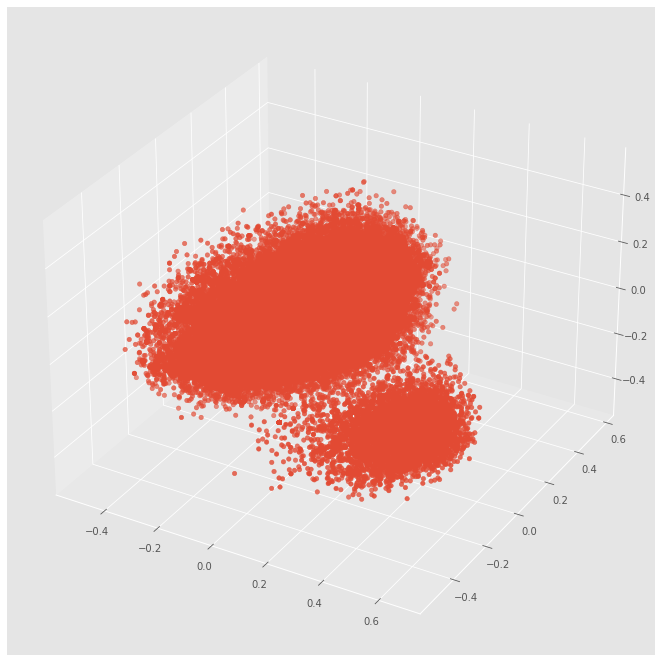

In [7]:
pca = PCA(n_components=3)
principalComponents = pca.fit_transform(X)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3'])
princomp = np.array(principalDf)

fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(princomp[:,0], princomp[:,1], princomp[:,2])

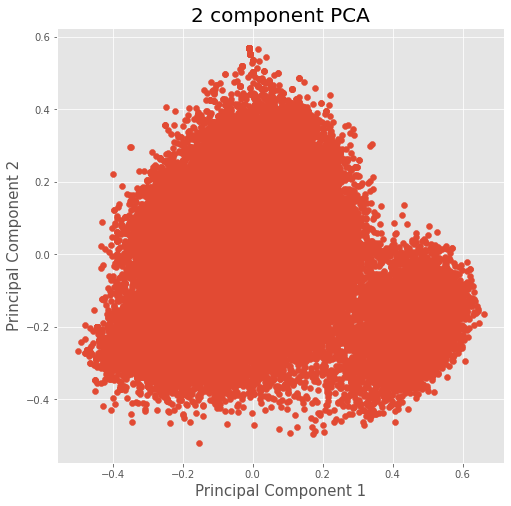

In [8]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
ax.scatter(princomp[: ,0], princomp[: ,1])

## **K-MEANS**

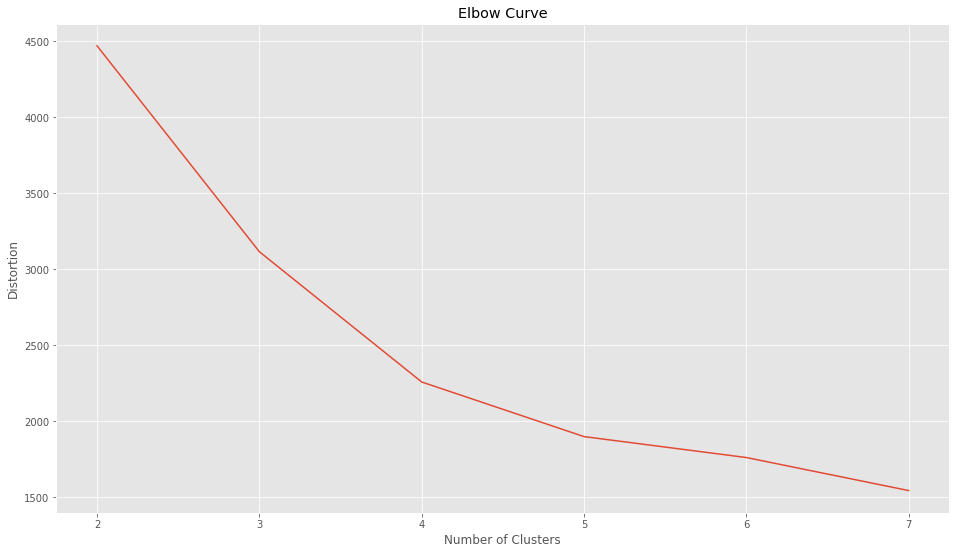

In [9]:
#Define the optimal k class
Nc = range(2, 8)
kmeans = [clt.MiniBatchKMeans(n_clusters=i, batch_size=1024) for i in Nc]
distortion = [kmeans[i].fit(princomp).inertia_ for i in range(len(kmeans))]
plt.plot(Nc,distortion)
plt.xlabel('Number of Clusters')
plt.ylabel('Distortion')
plt.title('Elbow Curve')
plt.show()

**K-MEANS WITH K = 3**

<ipython-input-10-2f5c5eff2ecf>:14: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  ax = Axes3D(fig)


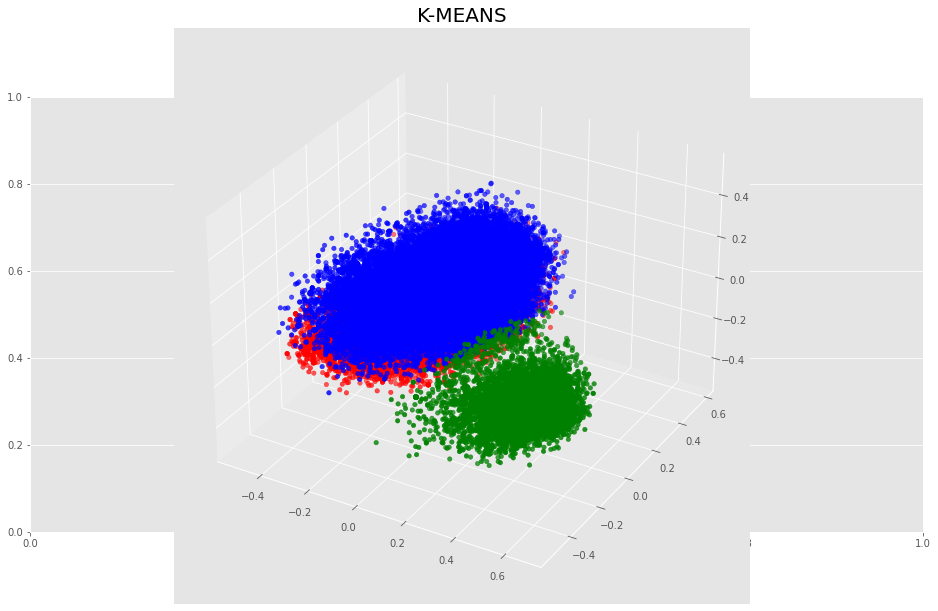

In [10]:
kmeans = clt.MiniBatchKMeans(n_clusters=3).fit(princomp)
labels_k3 = kmeans.predict(princomp)

# Getting the cluster centers
C = kmeans.cluster_centers_
colors=['red','green','blue']
asign=[]

for row in labels_k3:
    asign.append(colors[row])

#plotting 3D clusters
fig, ax = plt.subplots(figsize = (16,8))
ax = Axes3D(fig)
ax.scatter(princomp[:, 0], princomp[:, 1], princomp[:,2], c=asign)
ax.set_title('K-MEANS', fontsize = 20)
plt.show()

Text(0.5, 1.0, 'CENTROIDS')

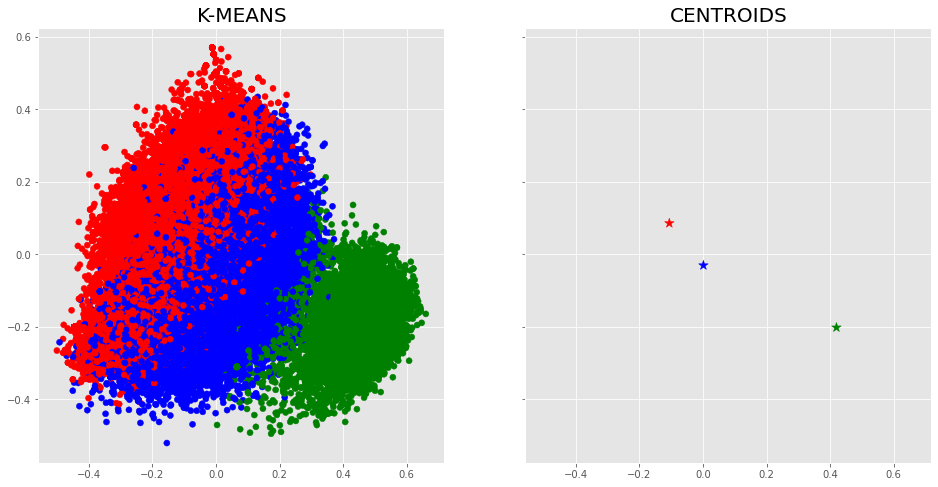

In [11]:
#plotting 2D clusters
fig, ax = plt.subplots(1,2, sharex=True, sharey=True, figsize = (16,8))
ax[0].scatter(princomp[:, 0], princomp[:, 1], c=asign)
ax[0].set_title('K-MEANS', fontsize = 20)
ax[1].scatter(C[:, 0], C[:, 1], c=colors, marker = "*", s = 100)
ax[1].set_title('CENTROIDS', fontsize = 20)

In [12]:
#Commit classification per author
k3_mean = pd.DataFrame()
k3_mean["AUTHOR"] = DB["AUTHOR"]
clusters= pd.DataFrame({"Cluster": labels_k3})
clusters = clusters["Cluster"].map(str).str.get_dummies()
k3_mean = pd.concat([k3_mean, clusters], axis = 1)
k3_mean = k3_mean.groupby(["AUTHOR"], as_index = False).agg("sum")
k3_mean.loc[len(k3_mean)] = ["Total", sum(k3_mean['0']), sum(k3_mean['1']), sum(k3_mean['2'])]
k3_mean

,AUTHOR,0,1,2
0,Adrian Crum,1,1,6
1,Adrian Nistor,0,0,1
2,Alan Gates,40,12,25
3,Alex Karasulu,17,3,27
4,Alexander Shraer,4,1,6
...,...,...,...,...
353,dlaha,1,1,0
354,ecki,1,1,2
355,markt,1,0,0
356,pjack,19,6,14


In [13]:
#Classificate authors in its maximum cluster
k3 = k3_mean.to_numpy()
author_cluster_k3 = []
author_cluster_k3 = pd.DataFrame()
author_cluster_k3["AUTHOR"] = k3[:, 0]
final_cluster = [np.argmax(k3[i,1:k3.shape[1]]) for i in range(k3.shape[0])]
author_cluster_k3["Final Cluster"] = final_cluster
author_cluster_k3
pd.pivot_table(author_cluster_k3, columns = "Final Cluster", aggfunc = "count")

Final Cluster,0,1,2
AUTHOR,113,5,240


Lets check group 2 authors!

In [14]:
outlier_authors =  author_cluster_k3[author_cluster_k3["Final Cluster"] == 1].copy()
outlier_authorsDB =  DB[DB["AUTHOR"].isin(outlier_authors["AUTHOR"])]
for i in range(5):
    print(outlier_authorsDB.iloc[i]["COMMIT_MESSAGE"])
    print()
outlier_authorsDB

fixed typo: die->due   git-svn-id: https://svn.apache.org/repos/asf/jakarta/commons/proper/beanutils/trunk@128781 13f79535-47bb-0310-9956-ffa450edef68

Added StripNameSpaceTransformer  git-svn-id: https://svn.apache.org/repos/asf/cocoon/trunk@492134 13f79535-47bb-0310-9956-ffa450edef68

Missing keyword Id while committed  git-svn-id: https://svn.apache.org/repos/asf/cocoon/trunk@492146 13f79535-47bb-0310-9956-ffa450edef68

CLI-269: Introduce CommandLine.Builder   git-svn-id: https://svn.apache.org/repos/asf/commons/proper/cli/trunk@1784363 13f79535-47bb-0310-9956-ffa450edef68

THRIFT-291  * README: tweak for Thrift's new home at Apache.   git-svn-id: https://svn.apache.org/repos/asf/incubator/thrift/trunk@739380 13f79535-47bb-0310-9956-ffa450edef68



,Unnamed: 0,PROJECT_ID,COMMIT_HASH,COMMIT_MESSAGE,AUTHOR,COMMITTER_DATE,inc_complexity,inc_violations,inc_development_cost
8048,17778,org.apache:beanutils,3a08220d010216caae97991073d08a60df10c2ff,fixed typo: die->due git-svn-id: https://svn...,Jan Luehe,2004-03-03 22:19:49+00:00,0.0,0.0,0.0
18918,45758,org.apache:cocoon,351cf54a565f1b480a3f648a82eb1ed96b73898f,Added StripNameSpaceTransformer git-svn-id: h...,Ard Schrijvers,2007-01-03 13:21:06+00:00,7.0,3.0,1230.0
18919,45759,org.apache:cocoon,dcaf74da53e6b33b5fc7cdf4fb33810ce9c9f784,Missing keyword Id while committed git-svn-id...,Ard Schrijvers,2007-01-03 13:40:16+00:00,0.0,0.0,0.0
24415,58518,org.apache:commons-cli,dc45fde7e5988908371eb4cccfeeb7a078bf714b,CLI-269: Introduce CommandLine.Builder git-s...,Robert Scholte,2017-02-25 11:09:03+00:00,4.0,1.0,900.0
57820,142036,org.apache:thrift,f0d35d220a339431a757c2ea8fb6316f4a24e0de,THRIFT-291 * README: tweak for Thrift's new h...,Greg Stein,2009-01-30 19:10:27+00:00,0.0,0.0,0.0
57821,142037,org.apache:thrift,c1eb2a71c3fecadfb8eee1b59dfedb91659a9873,THRIFT-292 Delete a number of generated artif...,Greg Stein,2009-01-30 19:19:45+00:00,-297.0,-265.0,-55110.0
57822,142038,org.apache:thrift,ca823297fa14c738f9f84edafde62f6c26e64886,THRIFT-295: remove empty directories. These d...,Greg Stein,2009-01-31 03:54:03+00:00,0.0,0.0,0.0
62730,152909,org.apache:zookeeper,a935c31e22d4967c9e97750e9b2f6d3be2fa0f3a,ZOOKEEPER-2066 Updates to README.txt (Wendy Sm...,Camille Fournier,2014-10-25 02:38:22+00:00,0.0,0.0,0.0
62755,152934,org.apache:zookeeper,11187e13da0430cdc90d8aed63a6f270d7612e2d,ZOOKEEPER-1893. automake: use serial-tests opt...,Camille Fournier,2015-03-15 00:14:39+00:00,0.0,0.0,0.0
62768,152947,org.apache:zookeeper,a3b80499f9d5ccb883471e318715a29a016a35b5,ZOOKEEPER-2173. ZK startup failure should be h...,Camille Fournier,2015-04-27 18:36:46+00:00,0.0,0.0,0.0


In [15]:
#Percentaje of authors per project in each project
k3_pj = pd.DataFrame()
k3_pj["PROJECT_ID"] = DB["PROJECT_ID"].copy()
clusters= pd.DataFrame({"Cluster": labels_k3})
clusters = clusters["Cluster"].map(str).str.get_dummies()
k3_pj = pd.concat([k3_pj, clusters], axis = 1)
k3_pj = k3_pj.groupby(["PROJECT_ID"], as_index = False).agg("sum")
k3_pj["tot"] = k3_pj["0"] +  k3_pj["1"] +  k3_pj["2"]
k3_pj["p0"] =  k3_pj["0"] / k3_pj["tot"]
k3_pj["p1"] = k3_pj["1"] / k3_pj["tot"]
k3_pj["p2"] = k3_pj["2"] / k3_pj["tot"]
k3_pj

,PROJECT_ID,0,1,2,tot,p0,p1,p2
0,org.apache:archiva,1926,444,2295,4665,0.412862,0.095177,0.491961
1,org.apache:batik,681,180,888,1749,0.389365,0.102916,0.507719
2,org.apache:bcel,525,123,674,1322,0.397126,0.093041,0.509834
3,org.apache:beanutils,479,104,626,1209,0.396195,0.086022,0.517783
4,org.apache:cayenne,517,122,602,1241,0.416600,0.098308,0.485093
5,org.apache:cocoon,3654,824,4444,8922,0.409549,0.092356,0.498095
6,org.apache:codec,710,158,860,1728,0.410880,0.091435,0.497685
7,org.apache:collections,1145,262,1354,2761,0.414705,0.094893,0.490402
8,org.apache:commons-cli,371,67,399,837,0.443250,0.080048,0.476703
9,org.apache:commons-exec,226,67,321,614,0.368078,0.109121,0.522801


In [16]:
k3_metrics = pd.DataFrame()
k3_metrics[["inc_complexity", "inc_violations", "inc_development_cost"]] = DB[["inc_complexity", "inc_violations", "inc_development_cost"]].copy()
clusters= pd.DataFrame({"Cluster": labels_k3})
k3_metrics = pd.concat([k3_metrics, clusters], axis = 1)
k3_metrics0 = k3_metrics[k3_metrics["Cluster"] == 0]
k3_metrics1 = k3_metrics[k3_metrics["Cluster"] == 1]
k3_metrics2 = k3_metrics[k3_metrics["Cluster"] == 2]
k3_metrics["Cluster"] = k3_metrics["Cluster"].map(str)

In [17]:
print("cluster 0 \n", "average \n", k3_metrics0.mean(),"variança \n",k3_metrics0.var())

cluster 0 
 average 
 inc_complexity            3.106263
inc_violations            1.046927
inc_development_cost    619.518325
Cluster                   0.000000
dtype: float64 variança 
 inc_complexity          2.658642e+05
inc_violations          2.924066e+04
inc_development_cost    5.911219e+09
Cluster                 0.000000e+00
dtype: float64


In [18]:
print("cluster 1 \n", "average \n", k3_metrics1.mean(),"variança \n",k3_metrics1.var())


cluster 1 
 average 
 inc_complexity            0.780534
inc_violations            2.344531
inc_development_cost    758.656331
Cluster                   1.000000
dtype: float64 variança 
 inc_complexity          2.292957e+05
inc_violations          5.284406e+04
inc_development_cost    7.963860e+09
Cluster                 0.000000e+00
dtype: float64


In [19]:
print("cluster 2 \n", "average \n",k3_metrics2.mean(),"variança \n",k3_metrics2.var())

cluster 2 
 average 
 inc_complexity             5.865356
inc_violations             2.600345
inc_development_cost    1034.143391
Cluster                    2.000000
dtype: float64 variança 
 inc_complexity          2.573518e+05
inc_violations          2.875872e+04
inc_development_cost    5.719219e+09
Cluster                 0.000000e+00
dtype: float64


In [20]:
k3_metrics
fig = px.box(k3_metrics, x="Cluster", y="inc_complexity", points = "all")
fig.show()

In [21]:
k3_metrics
fig = px.box(k3_metrics, x="Cluster", y="inc_violations")
fig.show()

In [22]:
k3_metrics
fig = px.box(k3_metrics, x="Cluster", y="inc_development_cost")
fig.show()

We observe no clear correlation between projects and how they write their commits.

figdata1 = [k3_metrics0["inc_complexity"], k3_metrics1["inc_complexity"],k3_metrics2["inc_complexity"]]
fig1, ax1 = plt.subplots()
ax1.boxplot(figdata1, showfliers=False)

figdata1 = [k3_metrics0["inc_violations"], k3_metrics1["inc_violations"],k3_metrics2["inc_violations"]]
fig1, ax1 = plt.subplots()
ax1.boxplot(figdata1, showfliers=False)

figdata1 = [k3_metrics0["inc_development_cost"], k3_metrics1["inc_development_cost"],k3_metrics2["inc_development_cost"]]
fig1, ax1 = plt.subplots()
ax1.boxplot(figdata1, showfliers=False)

In [21]:
authors0 = author_cluster_k3[author_cluster_k3["Final Cluster"] == 0] 
authors1 = author_cluster_k3[author_cluster_k3["Final Cluster"] == 1] 
authors2 = author_cluster_k3[author_cluster_k3["Final Cluster"] == 2] 
print(len(authors0))
print(len(authors1))
print(len(authors2))

113
5
240


In [22]:
authors0_commits = DB[DB["AUTHOR"].isin(authors0["AUTHOR"])]
a_0 = authors0_commits.sample(n=10, random_state= 1234)
for i in range(10):
    print(a_0.iloc[i]["COMMIT_MESSAGE"])
    print()

Updated the project version in default.properties   git-svn-id: https://svn.apache.org/repos/asf/jakarta/commons/proper/codec/trunk@130126 13f79535-47bb-0310-9956-ffa450edef68

Docs update. PR: Obtained from: Submitted by: Reviewed by:   git-svn-id: https://svn.apache.org/repos/asf/xmlgraphics/batik/trunk@199041 13f79535-47bb-0310-9956-ffa450edef68

Code clean-up. No functional change. Use direct static access as identified by Eclipse.  git-svn-id: https://svn.apache.org/repos/asf/jakarta/bcel/trunk@992360 13f79535-47bb-0310-9956-ffa450edef68

Revert the maven-plugin automatic commits again   git-svn-id: https://svn.apache.org/repos/asf/commons/proper/vfs/trunk@1741915 13f79535-47bb-0310-9956-ffa450edef68

removed a method that is only meant for internal use.   git-svn-id: https://svn.apache.org/repos/asf/jakarta/commons/proper/fileupload/trunk@133265 13f79535-47bb-0310-9956-ffa450edef68

Add an antrun execution that ensures that the LICENCE.txt and NOTICE.txt are included in the -java

In [23]:
authors1_commits = DB[DB["AUTHOR"].isin(authors1["AUTHOR"])]
a_1 = authors1_commits.sample(n=10, random_state =1234)
for i in range(10):
    print(a_1.iloc[i]["COMMIT_MESSAGE"])
    print()

ZOOKEEPER-2066 Updates to README.txt (Wendy Smoak via camille)  git-svn-id: https://svn.apache.org/repos/asf/zookeeper/trunk@1634174 13f79535-47bb-0310-9956-ffa450edef68

ZOOKEEPER-1893. automake: use serial-tests option (michim via camille)  git-svn-id: https://svn.apache.org/repos/asf/zookeeper/trunk@1666768 13f79535-47bb-0310-9956-ffa450edef68

ZOOKEEPER-2141 ACL cache in DataTree never removes entries (Adam Milne-Smith via camille)  git-svn-id: https://svn.apache.org/repos/asf/zookeeper/trunk@1738012 13f79535-47bb-0310-9956-ffa450edef68

Missing keyword Id while committed  git-svn-id: https://svn.apache.org/repos/asf/cocoon/trunk@492146 13f79535-47bb-0310-9956-ffa450edef68

ZOOKEEPER-2173. ZK startup failure should be handled with proper error message (J.Andreina via camille)  git-svn-id: https://svn.apache.org/repos/asf/zookeeper/trunk@1676359 13f79535-47bb-0310-9956-ffa450edef68

ZOOKEEPER-2141. ACL cache in DataTree never removes entries (Adam Milne-Smith via camille)  git-svn-i

In [24]:
authors2_commits = DB[DB["AUTHOR"].isin(authors2["AUTHOR"])]
a_2 = authors2_commits.sample(n=5, random_state=1234)
for i in range(5):
    print(a_2.iloc[i]["COMMIT_MESSAGE"])
    print()

simplify  git-svn-id: https://svn.apache.org/repos/asf/commons/proper/bcel/trunk@1152074 13f79535-47bb-0310-9956-ffa450edef68

HTTPCORE-39 followup  git-svn-id: https://svn.apache.org/repos/asf/jakarta/httpcomponents/httpcore/trunk@503419 13f79535-47bb-0310-9956-ffa450edef68

Make private immutable variable final Missing @Override markers  git-svn-id: https://svn.apache.org/repos/asf/httpcomponents/httpclient/trunk@1023974 13f79535-47bb-0310-9956-ffa450edef68

Add eol-style native  git-svn-id: https://svn.apache.org/repos/asf/commons/proper/net/branches/NET_2_0@633759 13f79535-47bb-0310-9956-ffa450edef68

Better error messages  git-svn-id: https://svn.apache.org/repos/asf/cocoon/trunk@290910 13f79535-47bb-0310-9956-ffa450edef68



Now we will look entries each cluster (to see how they're structured and all that)

In [51]:
DB_subj = DB.copy()
DB_subj["labels"] = labels_k3
d_0 = DB_subj[DB_subj["labels"] == 0]
d_1 = DB_subj[DB_subj["labels"] == 1]
d_2 = DB_subj[DB_subj["labels"] == 2]

In [55]:
d_0s = d_0.sample(n=10, random_state=12345)
for i in range(10):
    print(d_0s.iloc[i]["COMMIT_MESSAGE"])
    print()

HIVE-5981 - Add hive-unit back to itests pom (Brock Noland reviewed by Prasad)  git-svn-id: https://svn.apache.org/repos/asf/hive/trunk@1549075 13f79535-47bb-0310-9956-ffa450edef68

remove dependency on xmlbeans which is optional; switch to Xerces 2.8; remove dependeny to xml-apis as xml-apis is a transitive dependency coming with Xerces 2.8; change order of dependencies - test and Ant dependency at the end  git-svn-id: https://svn.apache.org/repos/asf/cocoon/trunk@407531 13f79535-47bb-0310-9956-ffa450edef68

Fix layout handling  git-svn-id: https://svn.apache.org/repos/asf/cocoon/trunk@37378 13f79535-47bb-0310-9956-ffa450edef68

Javadoc formatting.  git-svn-id: https://svn.apache.org/repos/asf/commons/proper/collections/trunk@1388152 13f79535-47bb-0310-9956-ffa450edef68

Missing annotations; extraneous semi-colon  git-svn-id: https://svn.apache.org/repos/asf/commons/proper/io/trunk@1003685 13f79535-47bb-0310-9956-ffa450edef68

* Log errors handled by map:handl-errors to a separate log

In [58]:
d_1s = d_1.sample(n=10, random_state=12345)
for i in range(10):
    print(d_1s.iloc[i]["COMMIT_MESSAGE"])
    print()

DBCP Configuration parameters   git-svn-id: https://svn.apache.org/repos/asf/jakarta/commons/proper/dbcp/trunk@132039 13f79535-47bb-0310-9956-ffa450edef68

Prepare for v1.2  git-svn-id: https://svn.apache.org/repos/asf/jakarta/commons/proper/io/trunk@385208 13f79535-47bb-0310-9956-ffa450edef68

allow block eclipse project depending on another block eclipse project  git-svn-id: https://svn.apache.org/repos/asf/cocoon/trunk@154718 13f79535-47bb-0310-9956-ffa450edef68

[MRM-792] -removed reference to Maven and updated link to Continuum site   git-svn-id: https://svn.apache.org/repos/asf/archiva/trunk@673591 13f79535-47bb-0310-9956-ffa450edef68

HIVE-9772 - Hive parquet timestamp conversion doesn't work with new Parquet (Jimmy Xiang via Brock)  git-svn-id: https://svn.apache.org/repos/asf/hive/trunk@1662588 13f79535-47bb-0310-9956-ffa450edef68

New utility method  git-svn-id: https://svn.apache.org/repos/asf/cocoon/trunk@422647 13f79535-47bb-0310-9956-ffa450edef68

Minor documentation chan

In [63]:
d_2s = d_2.sample(n=20, random_state=12345)
for i in range(20):
    print(d_2s.iloc[i]["COMMIT_MESSAGE"])
    print()

Temporary fix pending the release of the next version of JDOM  which currently has an incompatible API change.   git-svn-id: https://svn.apache.org/repos/asf/jakarta/commons/proper/jxpath/trunk@136866 13f79535-47bb-0310-9956-ffa450edef68

providing more constructive build/mirror info  git-svn-id: https://svn.apache.org/repos/asf/cocoon/trunk@448658 13f79535-47bb-0310-9956-ffa450edef68

remove refimpl PR: Obtained from: Submitted by: Reviewed by:   git-svn-id: https://svn.apache.org/repos/asf/xmlgraphics/batik/trunk@199364 13f79535-47bb-0310-9956-ffa450edef68

Fix bug pointed out by FindBugs - it was removing the Boolean from the options  not the option  git-svn-id: https://svn.apache.org/repos/asf/commons/proper/cli/trunk@639940 13f79535-47bb-0310-9956-ffa450edef68

Disable a test under JDK 1.4 as required classes from org.slf4j are compiled with Java 1.5.  git-svn-id: https://svn.apache.org/repos/asf/commons/proper/configuration/trunk@895232 13f79535-47bb-0310-9956-ffa450edef68

Upgra

**K-MEANS k=4**

<ipython-input-25-3c56e8f9c303>:14: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  ax = Axes3D(fig)


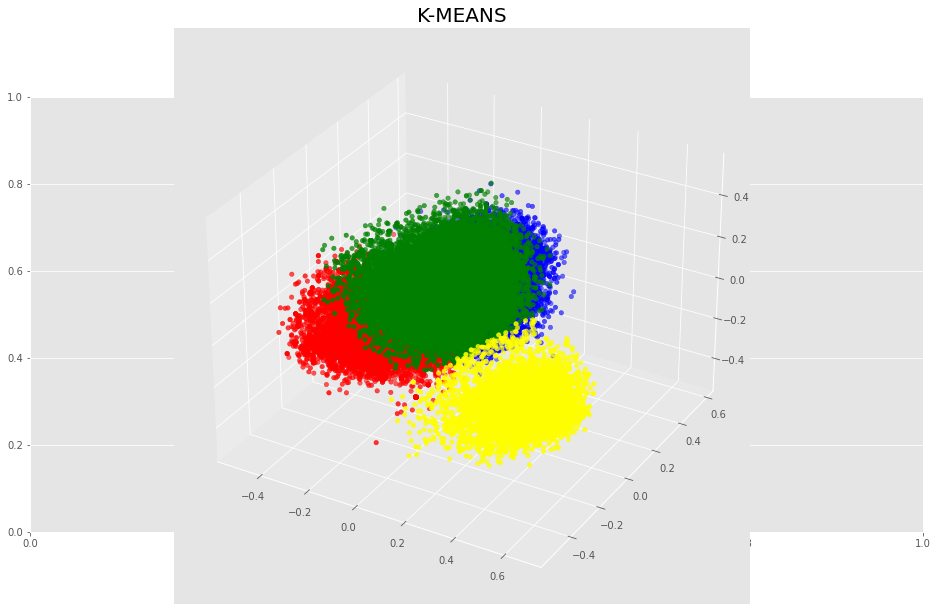

In [25]:
kmeans = clt.MiniBatchKMeans(n_clusters=4).fit(princomp)
labels_k4 = kmeans.predict(princomp)

# Getting the cluster centers
C = kmeans.cluster_centers_
colors=['red','green','blue', 'yellow']
asign=[]

for row in labels_k4:
    asign.append(colors[row])

#Plotting 3D clusters
fig, ax = plt.subplots(figsize = (16,8))
ax = Axes3D(fig)
ax.scatter(princomp[:, 0], princomp[:, 1], princomp[:,2], c=asign)
ax.set_title('K-MEANS', fontsize = 20)
plt.show()

Text(0.5, 1.0, 'CENTROIDS')

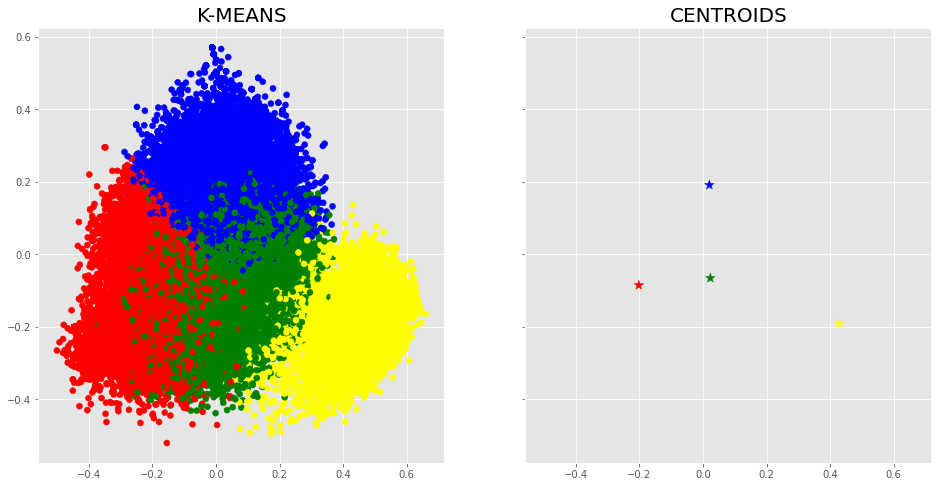

In [26]:
#Plotting 2D clusters
fig, ax = plt.subplots(1,2, sharex=True, sharey=True, figsize = (16,8))
ax[0].scatter(princomp[:, 0], princomp[:, 1], c=asign)
ax[0].set_title('K-MEANS', fontsize = 20)
ax[1].scatter(C[:, 0], C[:, 1], c=colors, marker = "*", s = 100)
ax[1].set_title('CENTROIDS', fontsize = 20)

In [27]:
#Commit classification per author
k4_mean = pd.DataFrame()
k4_mean["AUTHOR"] = DB["AUTHOR"]
clusters= pd.DataFrame({"Cluster": labels_k4})
clusters = clusters["Cluster"].map(str).str.get_dummies()
k4_mean = pd.concat([k4_mean, clusters], axis = 1)
k4_mean = k4_mean.groupby(["AUTHOR"], as_index= False).agg("sum")
k4_mean.loc[len(k4_mean)] = ["Total", sum(k4_mean['0']), sum(k4_mean['1']), sum(k4_mean['2']), sum(k4_mean['3'])]
k4_mean

,AUTHOR,0,1,2,3
0,Adrian Crum,1,4,2,1
1,Adrian Nistor,0,1,0,0
2,Alan Gates,16,17,32,12
3,Alex Karasulu,18,16,11,2
4,Alexander Shraer,1,5,4,1
...,...,...,...,...,...
353,dlaha,1,0,0,1
354,ecki,0,2,1,1
355,markt,0,0,1,0
356,pjack,8,9,16,6


In [28]:
#Classificate authors in its maximum cluster
k4 = k4_mean.to_numpy()
author_cluster_k4 = []
    
author_cluster_k4 = pd.DataFrame()
author_cluster_k4["AUTHOR"] = k4[:, 0]
final_cluster = [np.argmax(k4[i,1:k4.shape[1]]) for i in range(k4.shape[0])]
author_cluster_k4["Final Cluster"] = final_cluster
print(author_cluster_k4)
pd.pivot_table(author_cluster_k4, columns = "Final Cluster", aggfunc = "count")

               AUTHOR  Final Cluster
0         Adrian Crum              1
1       Adrian Nistor              1
2          Alan Gates              2
3       Alex Karasulu              0
4    Alexander Shraer              1
..                ...            ...
353             dlaha              0
354              ecki              1
355             markt              2
356             pjack              2
357             Total              1

[358 rows x 2 columns]


Final Cluster,0,1,2,3
AUTHOR,57,182,116,3


# **EVALUATION**

In [29]:
from sklearn import metrics
#Calinski-Harabasz Index

CH_k3 = metrics.calinski_harabasz_score(X, labels_k3)
CH_k4 = metrics.calinski_harabasz_score(X, labels_k4)

print("Calinski-Harabasz Index para K = 3:", CH_k3)
print("Calinski-Harabasz Index para K = 4:", CH_k4)

Calinski-Harabasz Index para K = 3: 1717.0414647971872
Calinski-Harabasz Index para K = 4: 1604.3539597526676


In [30]:
#Davies-Bouldin Index

DB_k3 = metrics.davies_bouldin_score(X, labels_k3)
DB_k4 = metrics.davies_bouldin_score(X, labels_k4)

print("Davies-Bouldin Index para K = 3:", DB_k3)
print("Davies-Bouldin Index para K = 4:", DB_k4)

Davies-Bouldin Index para K = 3: 5.2523511533946055
Davies-Bouldin Index para K = 4: 4.934100769460543
